In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('train.csv')


In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

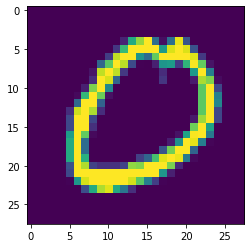

In [5]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [6]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
y.sample()

15450    3
Name: label, dtype: int64

In [8]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [9]:
X_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
knn = KNeighborsClassifier()

In [12]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [13]:
y_pred = knn.predict(X_test)

In [14]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [16]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [17]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [18]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [19]:
X_train_trf.shape

(33600, 200)

In [20]:
knn = KNeighborsClassifier()

In [21]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [22]:
y_pred = knn.predict(X_test_trf)

In [23]:
accuracy_score(y_test,y_pred)

0.9508333333333333

In [24]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.25845238095238093
0.3246428571428571
0.5104761904761905
0.6664285714285715
0.7375
0.8223809523809524
0.8430952380952381
0.871904761904762
0.8866666666666667
0.9054761904761904
0.9108333333333334
0.9175
0.9277380952380953
0.9351190476190476
0.9378571428571428
0.9377380952380953
0.940952380952381
0.9403571428571429
0.9417857142857143
0.9434523809523809
0.9433333333333334
0.9442857142857143
0.944047619047619
0.945952380952381
0.9483333333333334
0.9473809523809524
0.9471428571428572
0.9476190476190476
0.9498809523809524
0.9504761904761905
0.9517857142857142
0.9527380952380953
0.950595238095238
0.9503571428571429
0.9515476190476191
0.950595238095238
0.9521428571428572
0.9522619047619048
0.9527380952380953
0.9527380952380953
0.9526190476190476
0.9526190476190476
0.9527380952380953
0.9530952380952381
0.9530952380952381
0.9538095238095238
0.9546428571428571
0.9530952380952381
0.9527380952380953
0.9541666666666667
0.9534523809523809
0.9529761904761904
0.9530952380952381
0.9541666666666667
0.9

0.9427380952380953
0.9426190476190476
0.9423809523809524
0.9427380952380953
0.9428571428571428
0.9427380952380953
0.9422619047619047
0.9425
0.9421428571428572
0.9425
0.9421428571428572
0.9421428571428572
0.9420238095238095
0.9422619047619047
0.9421428571428572
0.9423809523809524
0.9420238095238095
0.9422619047619047
0.9422619047619047
0.9421428571428572
0.9419047619047619
0.9421428571428572
0.9421428571428572
0.9419047619047619
0.9417857142857143
0.9419047619047619
0.9417857142857143
0.9416666666666667
0.9417857142857143
0.9419047619047619
0.9414285714285714
0.9414285714285714
0.9417857142857143
0.9419047619047619
0.9420238095238095
0.9416666666666667
0.9416666666666667
0.9417857142857143
0.9421428571428572
0.9415476190476191
0.9411904761904762
0.9414285714285714
0.9417857142857143
0.9415476190476191
0.9410714285714286
0.9419047619047619
0.9415476190476191
0.9415476190476191
0.9419047619047619
0.9417857142857143
0.9413095238095238
0.9410714285714286
0.9408333333333333
0.940952380952381

In [25]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [26]:
X_train_trf

array([[-2.7186301 , -0.48977746],
       [-0.67696892, -6.75389956],
       [-3.03324868,  6.50996909],
       ...,
       [ 2.14884716,  0.78094974],
       [ 1.05956032,  0.94767122],
       [17.70257018,  1.96171153]])

In [27]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [28]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [29]:
X_train_trf

array([[-2.71864997, -0.48953645,  1.13587387],
       [-0.6769922 , -6.75396291, -2.3357589 ],
       [-3.03318708,  6.50978172,  7.49145118],
       ...,
       [ 2.14887456,  0.78073638, -0.74801403],
       [ 1.0595519 ,  0.94809897,  3.95003835],
       [17.70258263,  1.96215726, -4.94354347]])

In [30]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [31]:
pca.explained_variance_
# Eigen values

array([40.67111198, 29.17023397, 26.74459603])

In [32]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [33]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [34]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [35]:
pca.explained_variance_.shape

(784,)

In [36]:
pca.components_.shape

(784, 784)

In [37]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

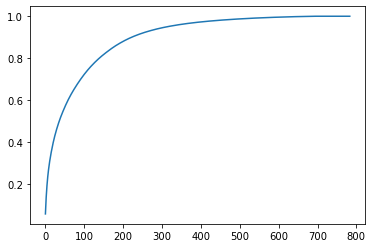

In [38]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))